In [1]:
import numpy as np
import pandas as pd

In [2]:
df = pd.read_csv('train.csv')

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

In [5]:
import matplotlib.pyplot as plt

In [6]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2 , random_state = 42)

In [8]:
X_train.shape

(33600, 784)

# Without PCA

In [9]:
from sklearn.neighbors import KNeighborsClassifier

In [10]:
knn = KNeighborsClassifier()

In [11]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [12]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

7.724377870559692


In [13]:
from sklearn.metrics import accuracy_score

In [14]:
accuracy_score(y_test,y_pred)

0.9648809523809524

# Using PCA

In [16]:
df = pd.read_csv('train.csv')
X = df.iloc[:,1:]
y = df.iloc[:,0]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2 , random_state = 42)

In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [18]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [19]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [20]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [21]:
X_train.shape

(33600, 784)

In [22]:
X_train_trf.shape

(33600, 200)

In [23]:
knn = KNeighborsClassifier()

In [24]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [25]:
y_pred = knn.predict(X_test_trf)

In [26]:
accuracy_score(y_test,y_pred)

0.9504761904761905

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

# transforming to a 2D coordinate system

In [27]:
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [28]:
X_train_trf

array([[-2.71862629, -0.48971371],
       [-0.67707105, -6.75300646],
       [-3.03322978,  6.5095757 ],
       ...,
       [ 2.14881882,  0.78060054],
       [ 1.05962832,  0.94753224],
       [17.70261535,  1.96178935]])

In [29]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

# transforming in 3D

In [30]:
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [31]:
X_train_trf

array([[-2.71845551, -0.4899125 ,  1.13535032],
       [-0.67699815, -6.75384823, -2.33580718],
       [-3.03323145,  6.5099632 ,  7.49176999],
       ...,
       [ 2.14878358,  0.78094853, -0.74746866],
       [ 1.05967601,  0.94766227,  3.94956996],
       [17.70251242,  1.96175135, -4.9434247 ]])

In [32]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [33]:
# Eigen Values (top 3)
pca.explained_variance_


array([40.67111197, 29.170234  , 26.74459616])

In [34]:
pca.components_

array([[ 3.65651668e-17,  1.74132377e-18, -1.58054426e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-1.67240562e-16, -3.31133486e-17, -2.12713570e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 4.97730921e-17, -4.15296785e-17,  5.37044637e-19, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [35]:
# Eigen Vector (top 3 for best eigen value)
pca.components_.shape

(3, 784)

In [36]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [37]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [38]:
pca.explained_variance_.shape

(784,)

In [39]:
pca.components_.shape

(784, 784)

In [40]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

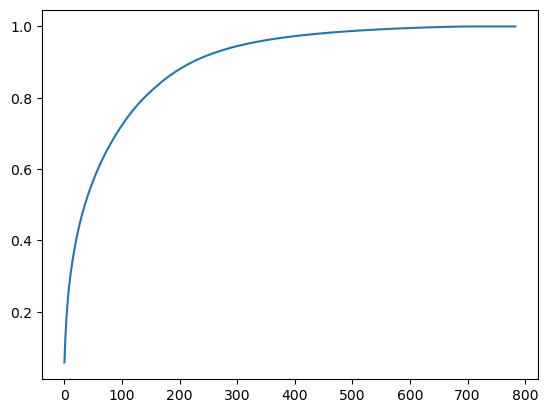

In [41]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))